## Analyse DICOM images

## Experiment 

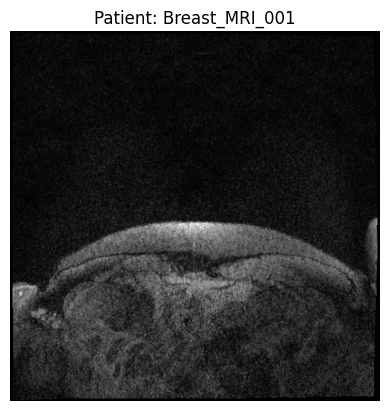

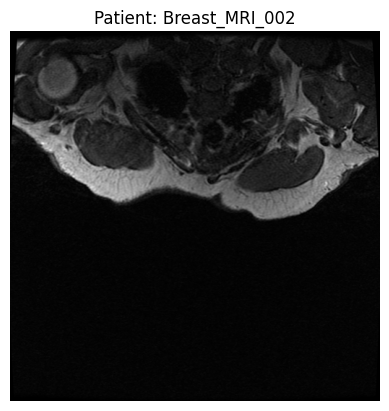

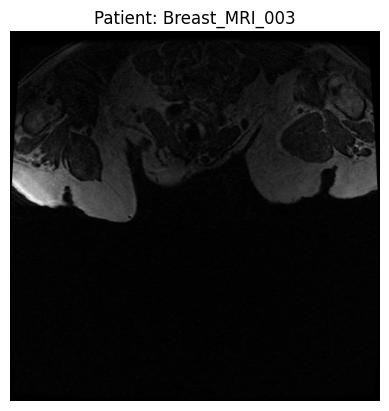

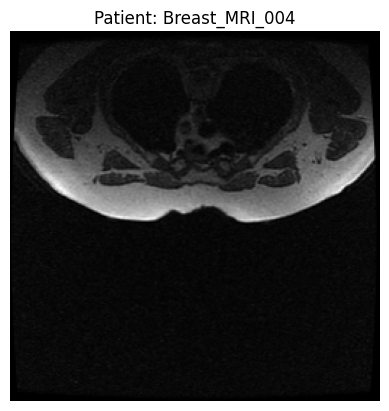

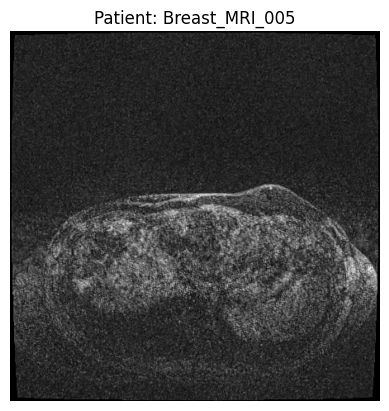

...

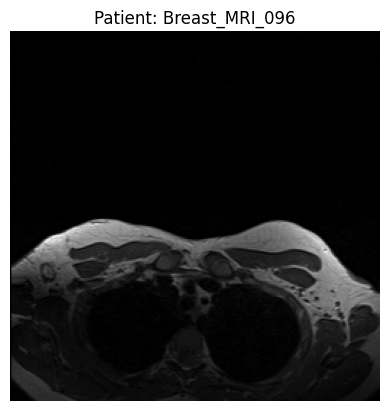

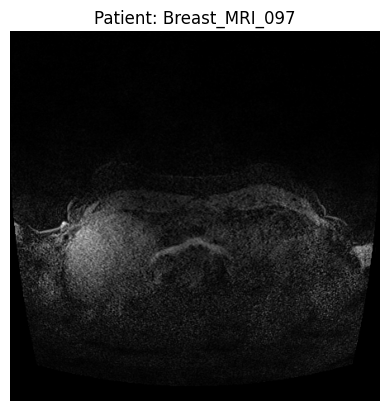

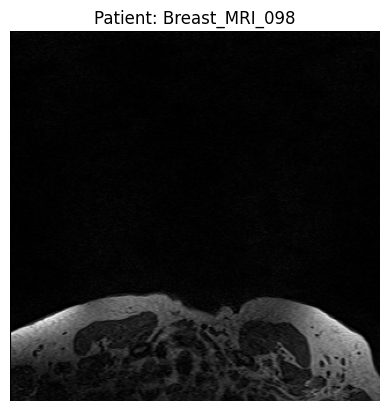

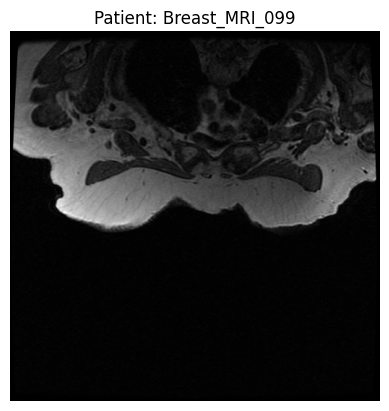

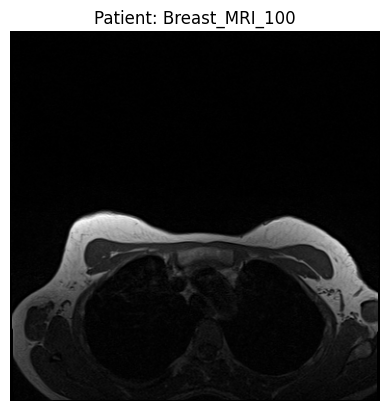

In [1]:
import os
import pydicom
import matplotlib.pyplot as plt

# Define the root dataset directory
dataset_dir = '../data/Duke-Breast-Cancer-MRI'

# Get sorted list of patient folders
patient_dirs = sorted(os.listdir(dataset_dir))[:100]  # Ensure we get the first 25 patients

# Iterate through each patient folder
for patient in patient_dirs:
    patient_path = os.path.join(dataset_dir, patient)
    
    if not os.path.isdir(patient_path):
        continue
    
    # Get the first-level subfolder inside the patient folder
    first_level = sorted(os.listdir(patient_path))
    if not first_level:
        continue
    first_level_path = os.path.join(patient_path, first_level[0])
    
    # Get the first DICOM-containing folder from this subfolder
    second_level = sorted(os.listdir(first_level_path))
    if not second_level:
        continue
    dicom_folder_path = os.path.join(first_level_path, second_level[0])
    
    # Get list of DICOM files inside this folder
    dicom_files = sorted([f for f in os.listdir(dicom_folder_path) if f.endswith('.dcm')])
    if not dicom_files:
        continue
    
    # Load the first DICOM image
    dicom_path = os.path.join(dicom_folder_path, dicom_files[0])
    ds = pydicom.dcmread(dicom_path)
    img = ds.pixel_array
    
    # Display the image
    plt.imshow(img, cmap='gray')
    plt.title(f'Patient: {patient}')
    plt.axis('off')
    plt.show()


## Analyse Clinical data

Dataset shape: (922, 98)
Number of patients: 922
                                                    Missing Values  Percentage
Unnamed: 67                                                    922  100.000000
Oncotype score                                                 661   71.691974
Pathologic response to Neoadjuvant therapy:  Pa...             657   71.258134
Contrast Bolus Volume (mL)                                     653   70.824295
Pathologic response to Neoadjuvant therapy: Pat...             653   70.824295
Pathologic response to Neoadjuvant therapy:  Pa...             652   70.715835
Overall Near-complete Response:  Looser Definition             610   66.160521
Near-complete Response (Graded Measure)                        610   66.160521
Overall Near-complete Response:  Stricter Defin...             610   66.160521
Clinical Response, Evaluated Through Imaging                   610   66.160521
Pathologic Response to Neoadjuvant Therapy                     610   66.160521
Rec

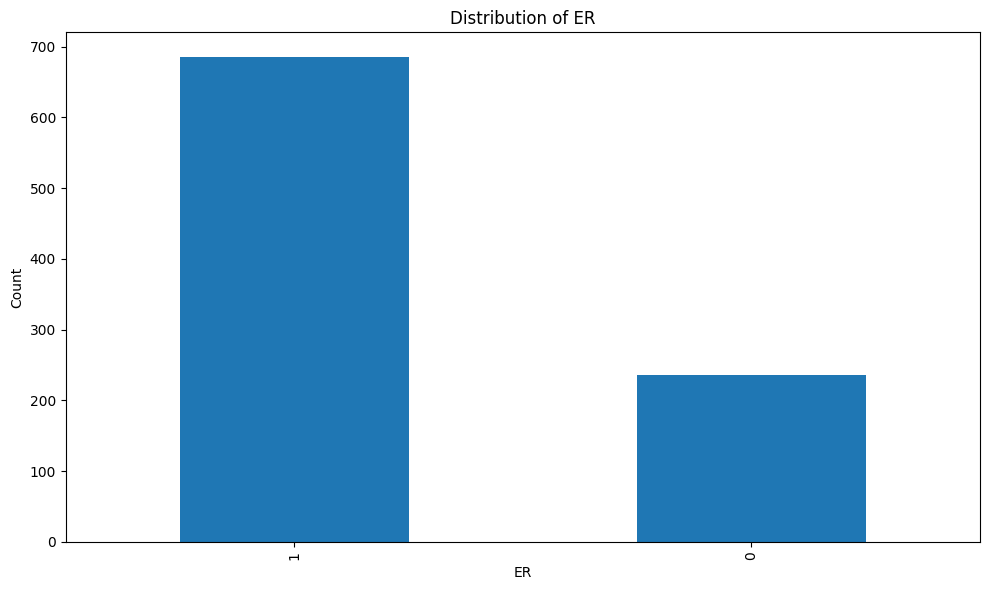

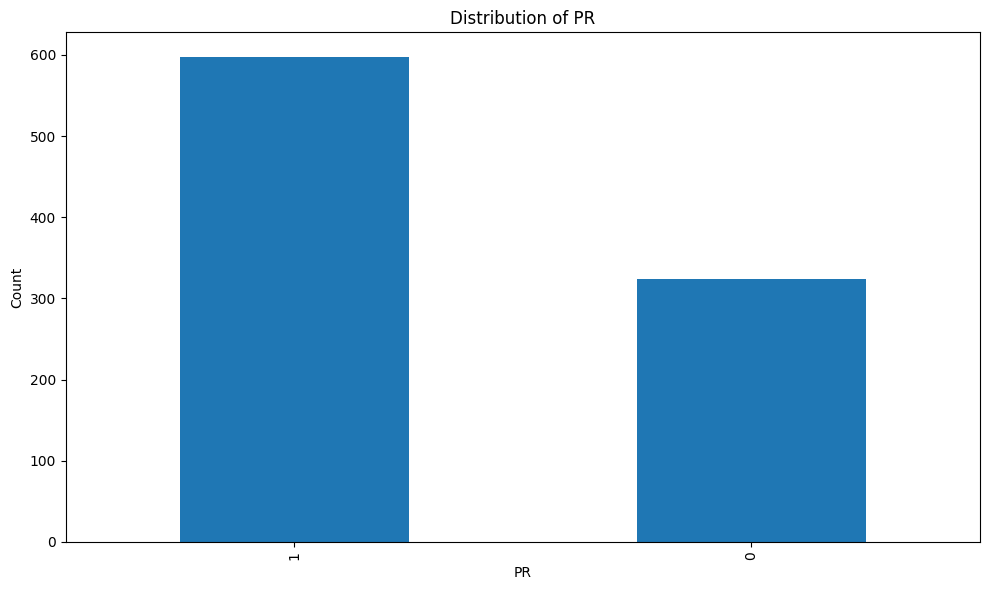

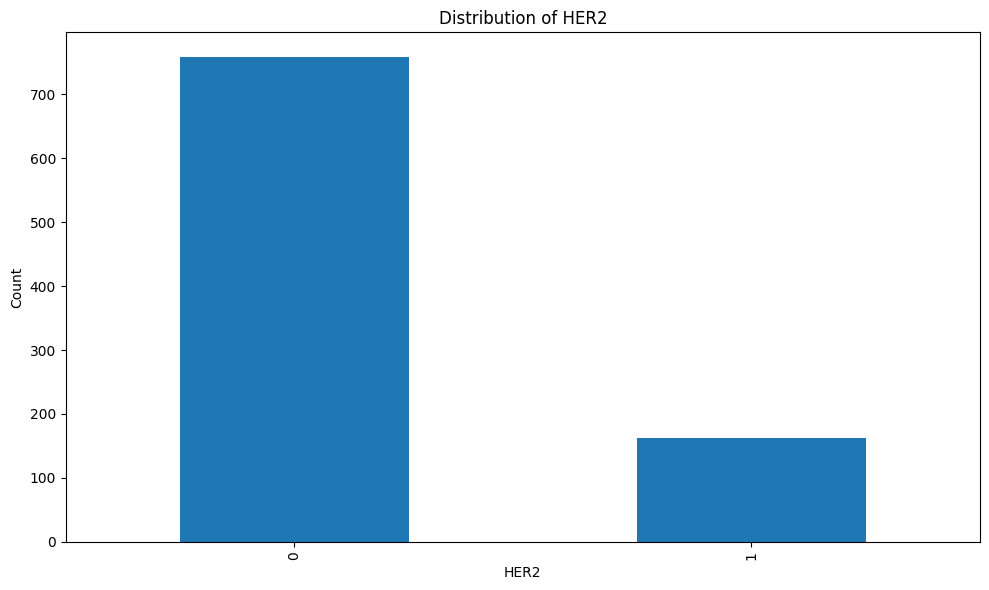

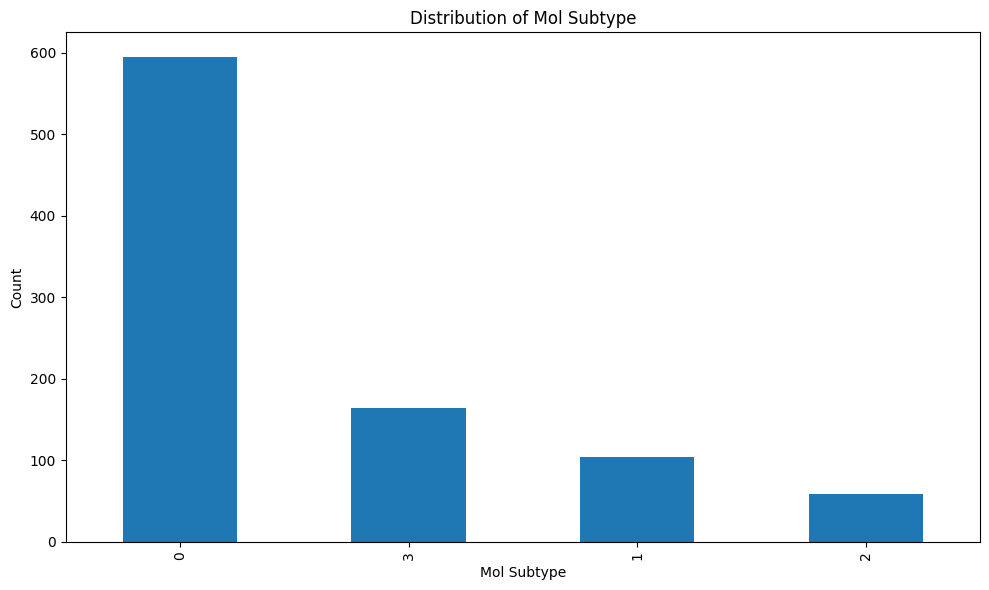

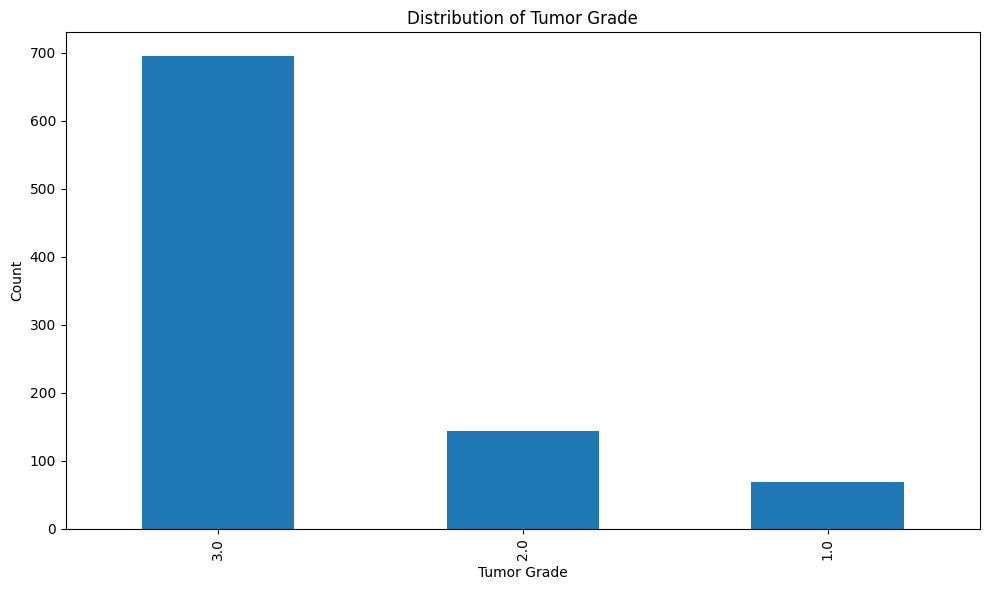

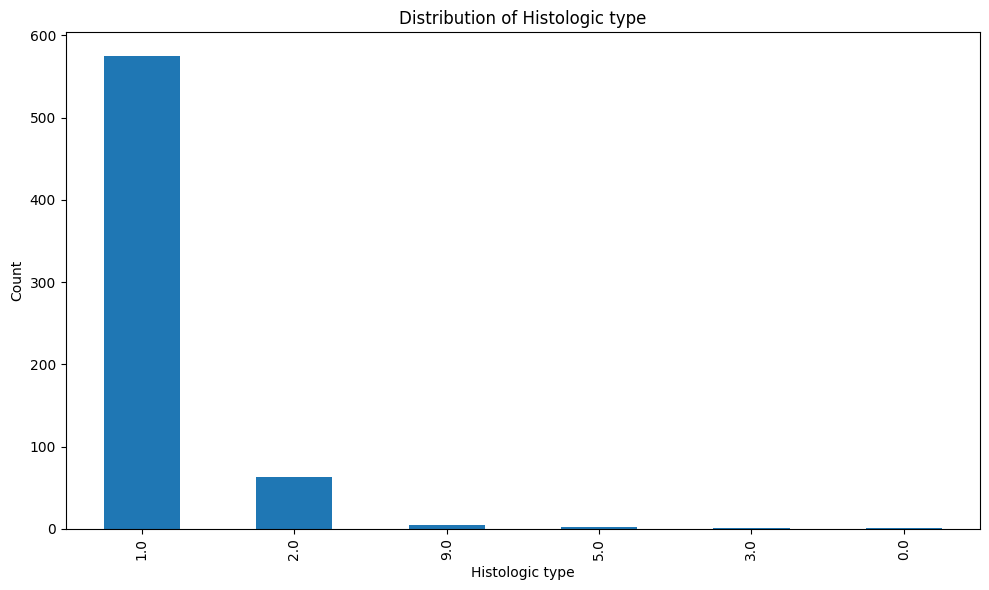

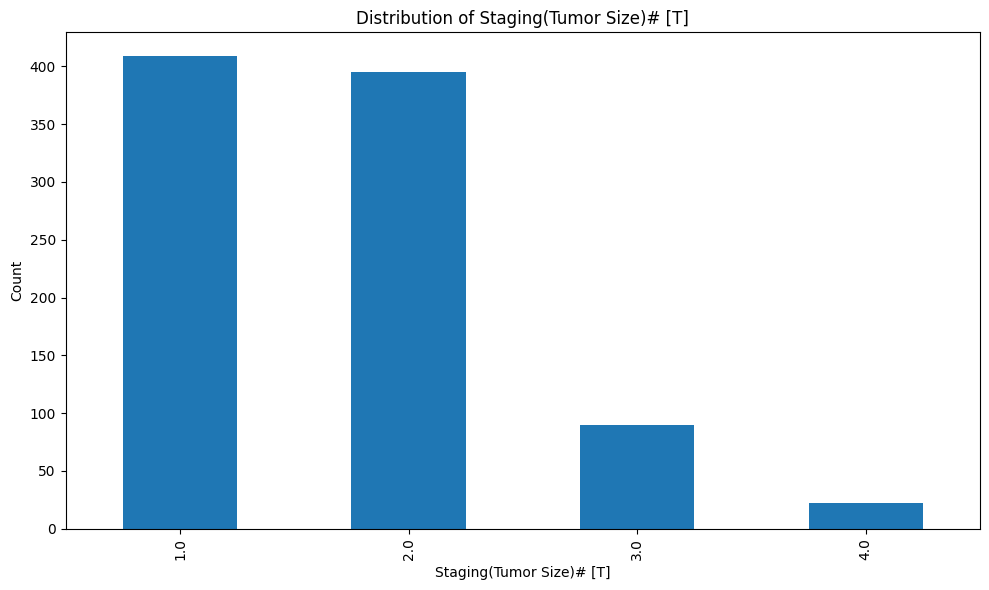

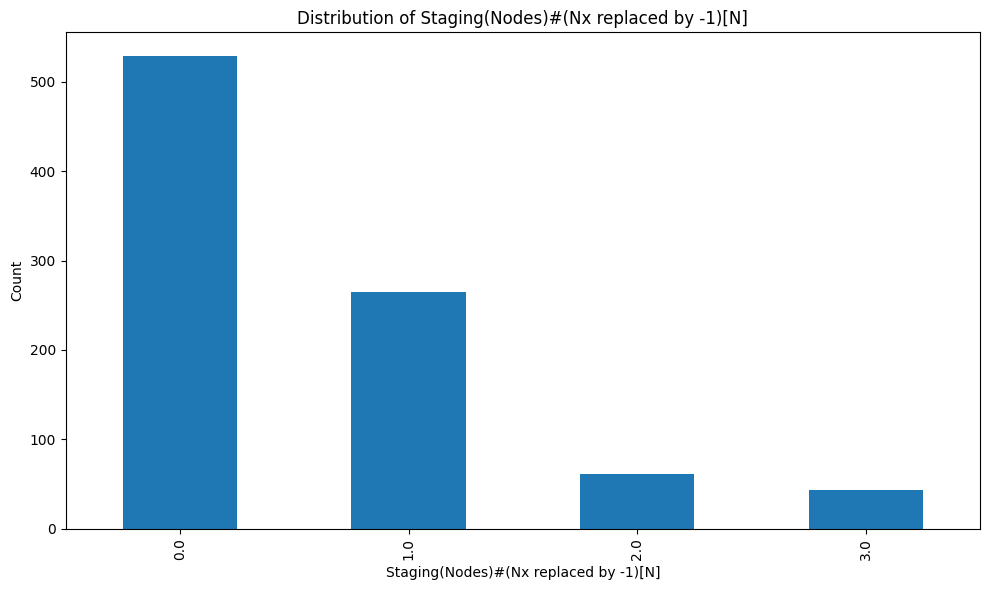

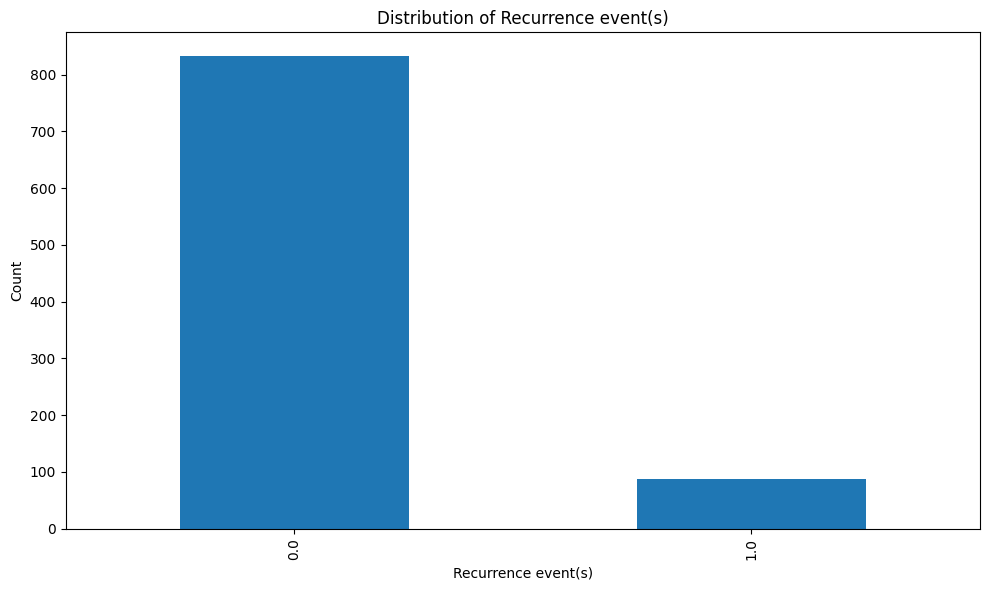

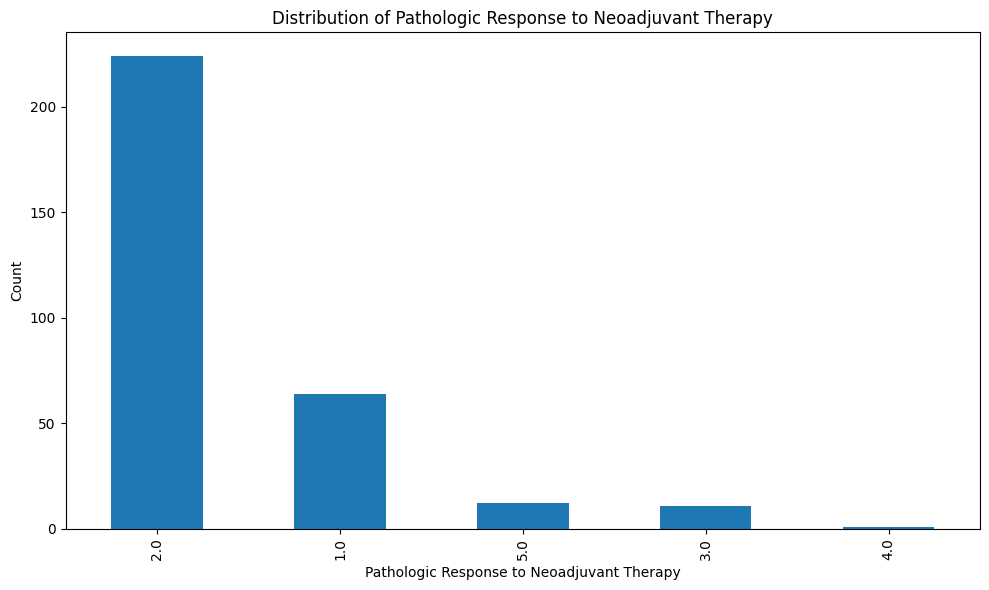

<Figure size 1200x800 with 0 Axes>

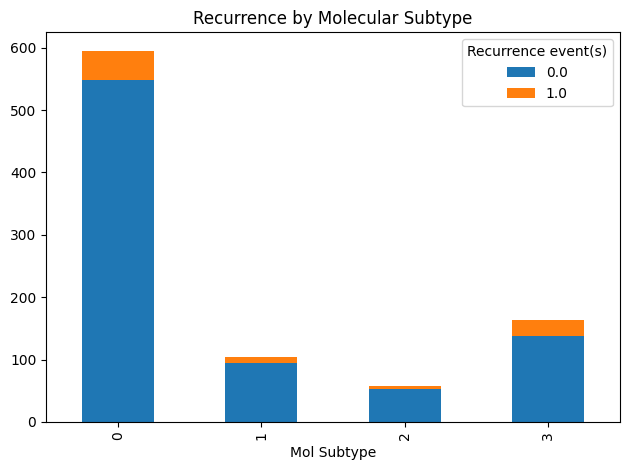

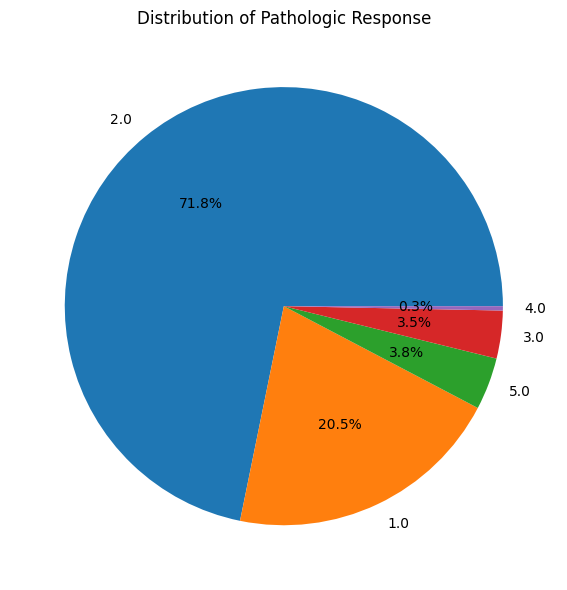

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the clinical data
clinical_data_path = "../data/Clinical_and_Other_Features.xlsx"
clinical_df = pd.read_excel(clinical_data_path, header=0, skiprows=[0, 2])

# Basic statistics
print("Dataset shape:", clinical_df.shape)
print("Number of patients:", clinical_df['Patient ID'].nunique())

# Check missing values
missing_values = clinical_df.isnull().sum()
missing_percent = (missing_values / len(clinical_df)) * 100
missing_df = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percent})
print(missing_df[missing_df['Missing Values'] > 0].sort_values('Percentage', ascending=False))

# Analyze key variables
key_variables = ['ER', 'PR', 'HER2', 'Mol Subtype', 'Tumor Grade', 'Histologic type', 
                 'Staging(Tumor Size)# [T]', 'Staging(Nodes)#(Nx replaced by -1)[N]',
                 'Recurrence event(s)', 'Pathologic Response to Neoadjuvant Therapy']

for var in key_variables:
    if var in clinical_df.columns:
        plt.figure(figsize=(10, 6))
        clinical_df[var].value_counts().plot(kind='bar')
        plt.title(f'Distribution of {var}')
        plt.ylabel('Count')
        plt.tight_layout()
        plt.show()

# Explore relationships between variables
if 'Mol Subtype' in clinical_df.columns and 'Recurrence event(s)' in clinical_df.columns:
    plt.figure(figsize=(12, 8))
    cross_tab = pd.crosstab(clinical_df['Mol Subtype'], clinical_df['Recurrence event(s)'])
    cross_tab.plot(kind='bar', stacked=True)
    plt.title('Recurrence by Molecular Subtype')
    plt.tight_layout()
    plt.show()

# Check distribution of outcomes
if 'Pathologic Response to Neoadjuvant Therapy' in clinical_df.columns:
    plt.figure(figsize=(10, 6))
    clinical_df['Pathologic Response to Neoadjuvant Therapy'].value_counts().plot(kind='pie', autopct='%1.1f%%')
    plt.title('Distribution of Pathologic Response')
    plt.ylabel('')
    plt.tight_layout()
    plt.show()

## Analyze Imaging Features

Imaging features shape: (922, 530)
       Patient ID  F1_DT_POSTCON (T11=0.05,T12=0.5)  \
0  Breast_MRI_001                          1.000000   
1  Breast_MRI_002                          1.000000   
2  Breast_MRI_003                          0.174775   
3  Breast_MRI_004                          0.086546   
4  Breast_MRI_005                          0.289669   

   F1_DT_POSTCON (T11=0.05,T12=0.1)  F1_DT_POSTCON (T11=0.02,T12=0.5)  \
0                          0.120721                          0.530395   
1                          0.129546                          0.485217   
2                          0.062051                          0.069910   
3                          0.045111                          0.034619   
4                          0.052031                          0.115868   

   F1_DT_POSTCON (T11=0.02,T12=0.8)  F1_DT_POSTCON (T11=0.05,T12=0.8)  \
0                          1.000000                          1.000000   
1                          1.000000              

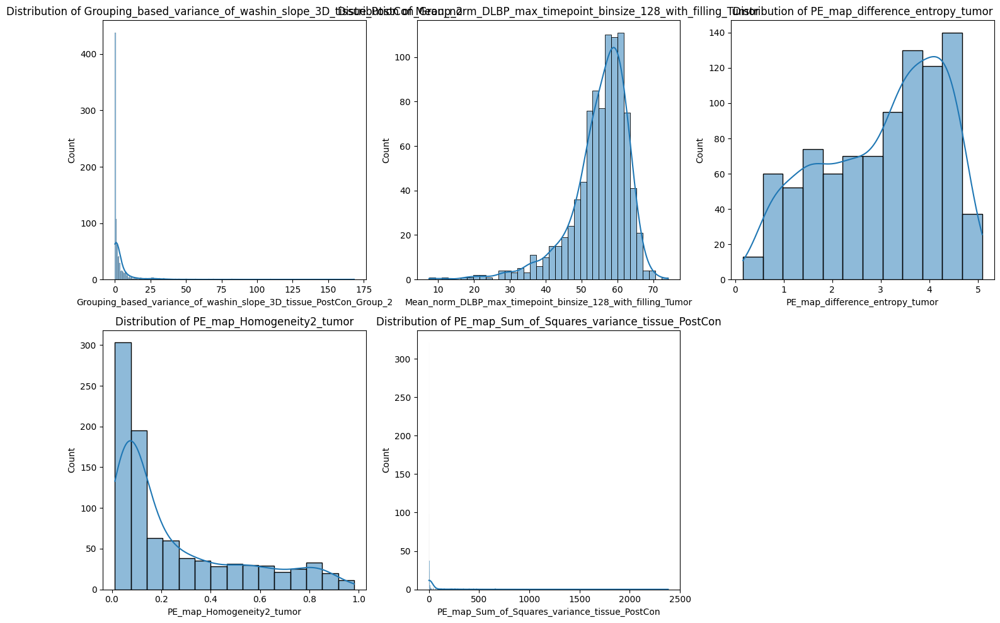

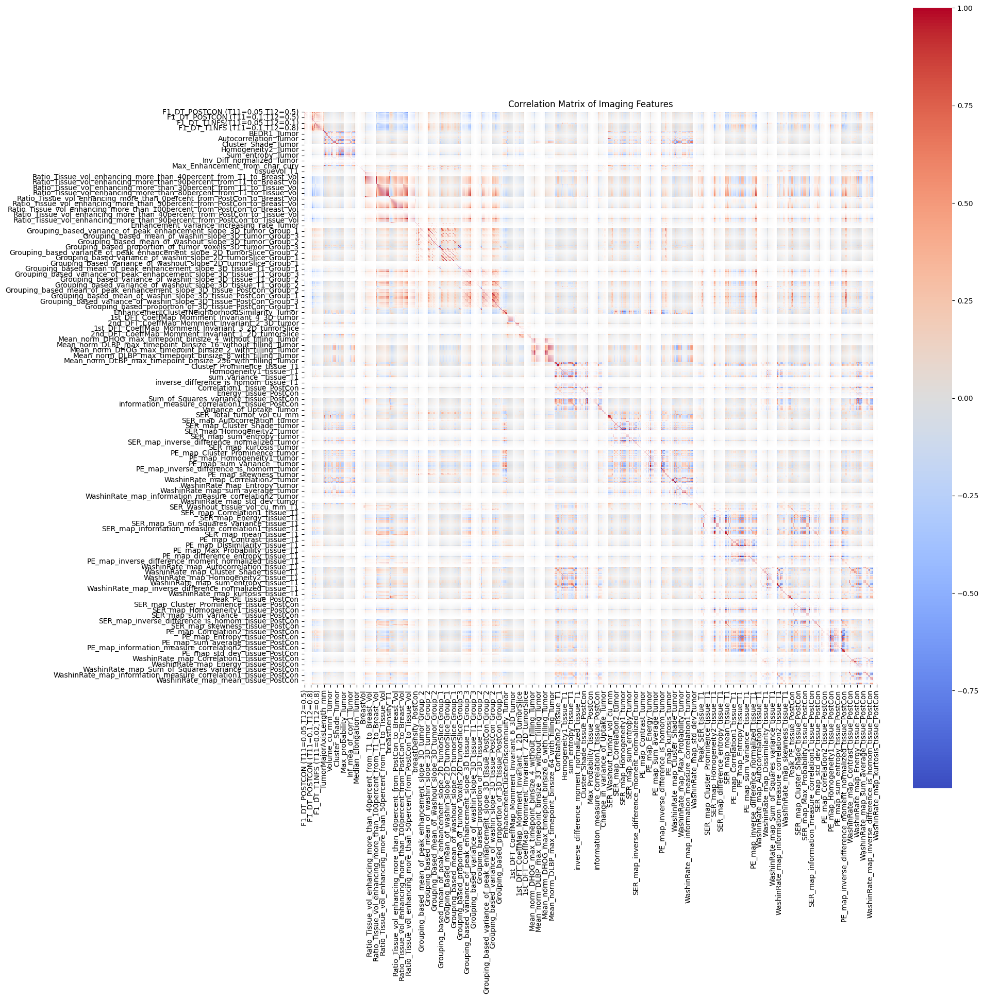

In [5]:
# Load the imaging features data
imaging_features_path = "../data/Imaging_Features.xlsx"
features_df = pd.read_excel(imaging_features_path)

# Basic statistics
print("Imaging features shape:", features_df.shape)

# Check the first few rows
print(features_df.head())

# Check missing values
missing_values = features_df.isnull().sum()
missing_percent = (missing_values / len(features_df)) * 100
missing_df = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percent})
print(missing_df[missing_df['Missing Values'] > 0].sort_values('Percentage', ascending=False))

# Visualize the distribution of some key features
# Select numerical columns for visualization (sample 5 random features)
numeric_cols = features_df.select_dtypes(include=['float64', 'int64']).columns
sample_cols = np.random.choice(numeric_cols, min(5, len(numeric_cols)), replace=False)

plt.figure(figsize=(15, 10))
for i, col in enumerate(sample_cols):
    plt.subplot(2, 3, i+1)
    sns.histplot(features_df[col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# Correlation matrix of imaging features
plt.figure(figsize=(20, 20))
corr_matrix = features_df.select_dtypes(include=['float64', 'int64']).corr()
sns.heatmap(corr_matrix, cmap='coolwarm', center=0, 
            square=True, linewidths=.5, annot=False)
plt.title('Correlation Matrix of Imaging Features')
plt.tight_layout()
plt.show()

## Merge Clinical and Imaging Data

In [6]:
# Merge clinical and imaging data
# Assuming 'Patient ID' is the common column
merged_df = pd.merge(clinical_df, features_df, on='Patient ID', how='inner')

print(f"Number of patients in clinical data: {clinical_df['Patient ID'].nunique()}")
print(f"Number of patients in imaging features: {features_df['Patient ID'].nunique()}")
print(f"Number of patients after merging: {merged_df['Patient ID'].nunique()}")

# Save the merged dataset for later use
merged_df.to_csv("merged_clinical_imaging_data.csv", index=False)

Number of patients in clinical data: 922
Number of patients in imaging features: 922
Number of patients after merging: 922
